# Imports and setup

In [1]:
import numpy as np
import pandas as pd
from typing import List
from numpy.typing import ArrayLike
import matplotlib.pyplot as plt
import pytensor.tensor as pt
import pymc as pm
import arviz as az
plt.style.use('bmh')

In [2]:
%config InlineBackend.figure_format = 'retina'

# Exploring Adstock-Saturation functions

## Adstock

In [3]:
def adstock(x_forward: np.ndarray, L: int, theta: int, alpha: int) -> np.ndarray:
    w = np.array([alpha**((l-theta)**2) for l in range(L)])

    return np.array([sum( x_forward[max(0,t-L+1): t+1][::-1] * w[:t+1-max(0, t-L+1)] ) / sum( w[:t+1-max(0, t-L+1)] )
                     for t in range(len(x_forward))])


In [4]:
rng = np.random.default_rng(seed=42)
x = rng.uniform(size=55)*1e9 # media spend

In [5]:
len(adstock(x, L=8, theta=1, alpha=0.1))

55

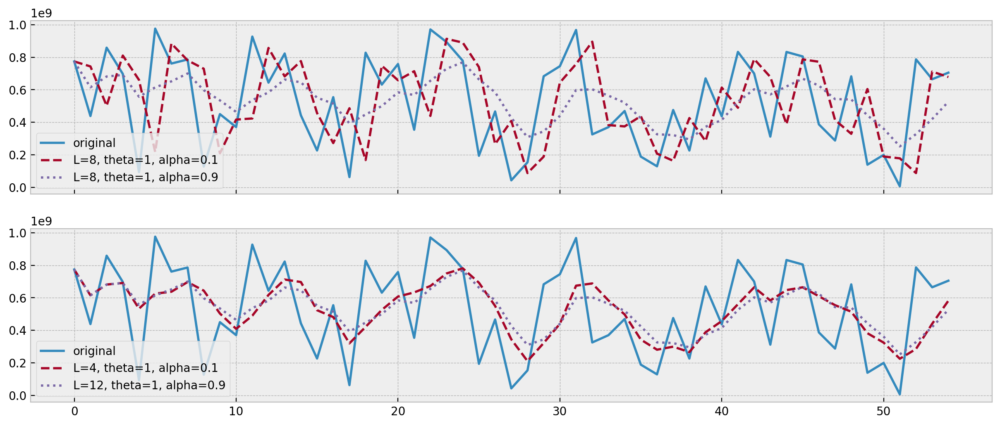

In [6]:
rng = np.random.default_rng(seed=42)
x = rng.uniform(size=55)*1e9 # media spend

fig, ax = plt.subplots(2,1, figsize=(15,6), sharex=True)
ax[0].plot(x, label='original')
ax[0].plot(adstock(x, L=8, theta=1, alpha=0.1), '--', label='L=8, theta=1, alpha=0.1')
ax[0].plot(adstock(x, L=8, theta=1, alpha=0.9), ':', label='L=8, theta=1, alpha=0.9')
ax[1].plot(x, label='original')
ax[1].plot(adstock(x, L=4, theta=1, alpha=0.9), '--', label='L=4, theta=1, alpha=0.1')
ax[1].plot(adstock(x, L=12, theta=1, alpha=0.9), ':', label='L=12, theta=1, alpha=0.9')
ax[0].legend()
ax[1].legend()

## Reach

In [7]:
def hill_transform(x: float, beta: float, slope: float, half_sat: float=1) -> float:
    return beta/(1 + (x/half_sat)**(-slope))


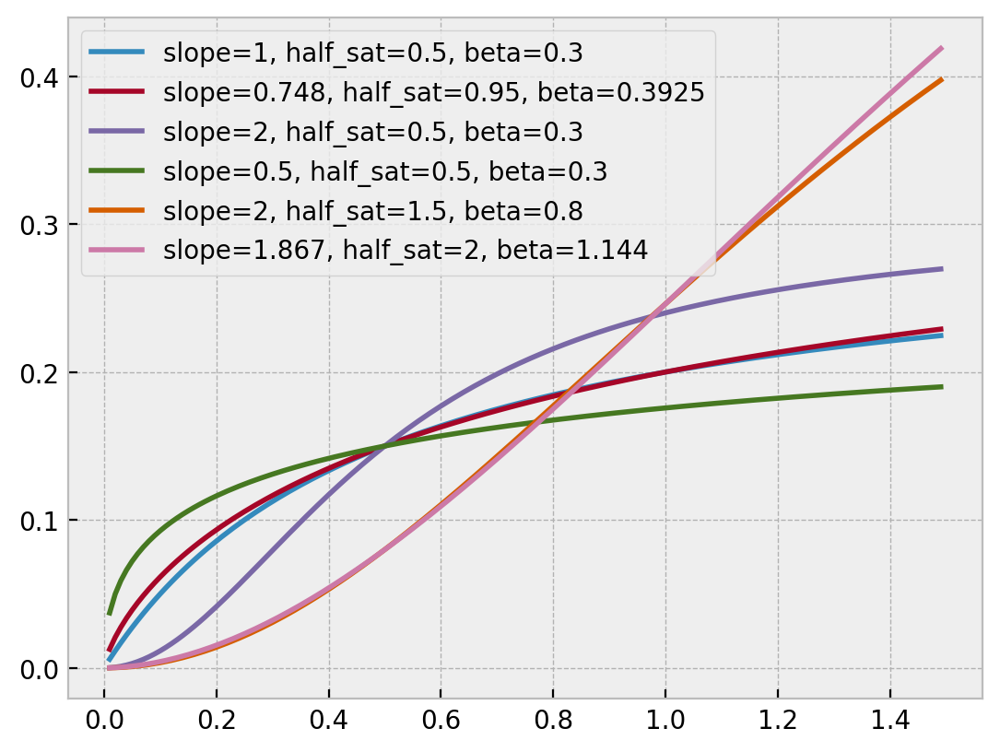

In [8]:
x = np.arange(0.01,1.5,0.01)
fig, ax = plt.subplots(1,1)
ax.plot(x, hill_transform(x, beta=0.3, slope=1, half_sat=0.5), label='slope=1, half_sat=0.5, beta=0.3')
ax.plot(x, hill_transform(x, beta=0.3925, slope=0.748, half_sat=0.95), label='slope=0.748, half_sat=0.95, beta=0.3925')
ax.plot(x, hill_transform(x, beta=0.3, slope=2, half_sat=0.5), label='slope=2, half_sat=0.5, beta=0.3')
ax.plot(x, hill_transform(x, beta=0.3, slope=0.5, half_sat=0.5), label='slope=0.5, half_sat=0.5, beta=0.3')
ax.plot(x, hill_transform(x, beta=0.8, slope=2, half_sat=1.5), label='slope=2, half_sat=1.5, beta=0.8')
ax.plot(x, hill_transform(x, beta=1.144, slope=1.867, half_sat=2), label='slope=1.867, half_sat=2, beta=1.144')
ax.legend()

# Dataset

In [9]:
df = pd.read_csv('data/data.csv') # data from: https://github.com/sibylhe/mmm_stan

# Media variables
# impressions
mdip_cols = [col for col in df.columns if 'mdip_' in col]
# media spending
mdsp_cols = [col for col in df.columns if 'mdsp_' in col]

# Control variables
# macro economic
me_cols = [col for col in df.columns if 'me_' in col]
# store counts
st_cols = [col for col in df.columns if 'st_' in col]
# markdown/discounts
mrkdn_cols = [col for col in df.columns if 'mrkdn_' in col]
# holidays
hldy_cols = [col for col in df.columns if 'hldy_' in col]
# seasonality
seas_cols = [col for col in df.columns if 'seas_' in col]
control_vars = me_cols+st_cols+mrkdn_cols+hldy_cols+seas_cols

# Sales variables
sales_cols = ['sales']

In [10]:
df.columns
# Media: direct mail, insert, newspaper, digital audio, radio, TV, digital video, social media, online display, email, SMS, affiliates, SEM

Index(['wk_strt_dt', 'yr_nbr', 'qtr_nbr', 'prd', 'wk_nbr', 'wk_in_yr_nbr',
       'mdip_dm', 'mdip_inst', 'mdip_nsp', 'mdip_auddig', 'mdip_audtr',
       'mdip_vidtr', 'mdip_viddig', 'mdip_so', 'mdip_on', 'mdip_em',
       'mdip_sms', 'mdip_aff', 'mdip_sem', 'mdsp_dm', 'mdsp_inst', 'mdsp_nsp',
       'mdsp_auddig', 'mdsp_audtr', 'mdsp_vidtr', 'mdsp_viddig', 'mdsp_so',
       'mdsp_on', 'mdsp_sem', 'sales', 'me_ics_all', 'me_gas_dpg', 'st_ct',
       'mrkdn_valadd_edw', 'mrkdn_pdm', 'va_pub_0.15', 'va_pub_0.2',
       'va_pub_0.25', 'va_pub_0.3', 'hldy_Black Friday', 'hldy_Christmas Day',
       'hldy_Christmas Eve', 'hldy_Columbus Day', 'hldy_Cyber Monday',
       'hldy_Day after Christmas', 'hldy_Easter', 'hldy_Father's Day',
       'hldy_Green Monday', 'hldy_July 4th', 'hldy_Labor Day', 'hldy_MLK',
       'hldy_Memorial Day', 'hldy_Mother's Day', 'hldy_NYE',
       'hldy_New Year's Day', 'hldy_Pre Thanksgiving', 'hldy_Presidents Day',
       'hldy_Prime Day', 'hldy_Thanksgiving', 'hl

In [11]:
media_dict = dict(zip(mdip_cols, ['direct mail', 'insert', 'newspaper', 'digital audio', 'radio', 'TV', 'digital video', 'social media', 'online display', 'email', 'SMS', 'affiliates', 'SEM']))

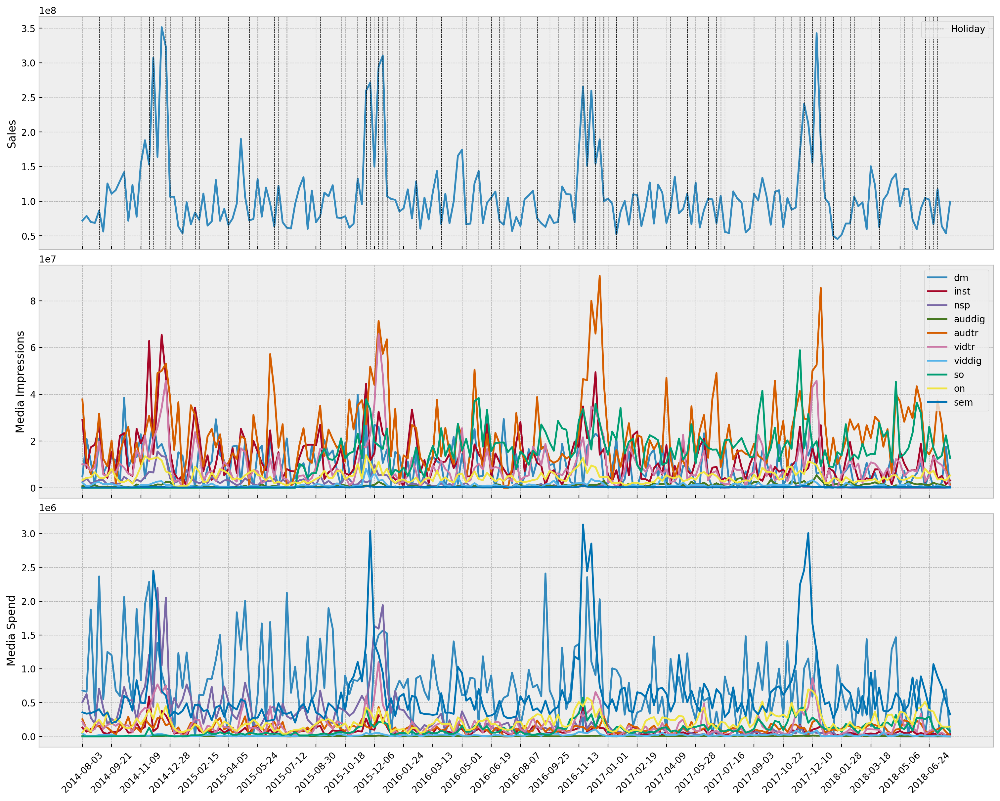

In [12]:
fig, ax = plt.subplots(3,1, figsize=(15,12), sharex=True, layout='constrained')
ax[0].plot(df['wk_strt_dt'], df['sales'])
ax[0].set_ylabel('Sales')

prevent_repeat_labels = 'Holiday'
for i in hldy_cols:
    for j in df.loc[df[i]==1, 'wk_strt_dt'].values:
        ax[0].axvline(x=j, color='black', linestyle='--', lw=0.5, label=prevent_repeat_labels)
        prevent_repeat_labels = '__nolegend__'

ax[0].legend(loc='upper right')

for i in mdsp_cols: # only plotting media impressions for which money was spent (email, sms, affiliates have no media spend)
    ax[1].plot(df['wk_strt_dt'], df['mdip_'+i[5:]], label=i[5:])
    ax[1].set_ylabel('Media Impressions')

    ax[2].plot(df['wk_strt_dt'], df[i], label=i[5:])
    ax[2].set_ylabel('Media Spend')
ax[1].legend(loc='upper right')

ax[2].tick_params(axis='x', rotation=45)
ax[2].set_xticks(df['wk_strt_dt'][0::7])
plt.show()

# Modelling

## Data prep functions

In [13]:
def scale_by_mean(df: pd.DataFrame, cols: List[str]) -> (pd.DataFrame, dict[float]):
    df_scaled = pd.DataFrame(columns=cols)
    df_means = {}
    for i in cols:
        mu = df[i].mean()
        df_scaled[i] = df[i]/mu
        df_means[i] = mu
    return df_scaled, df_means

From this [blog](https://juanitorduz.github.io/pymc_mmm/)

Remark: One would be tempted to use a MinMaxScaler here. However, this would lead to a problem when computing the (m)ROAS (see more details below). The reason is that for the ROAS computation we want to set the media cost to 0 (in the raw data scale!) and generate in-sample predictions. The problem comes when the media data never reaches 0. In this case, when using a MaxAbsScaler, the zero value of the transformed variable represents the minimum value of the original variable. Hence, when setting the media cost to 0, the transformed variable would be less than zero. This itself not a problem, but since most og the times we are restricting the regression coefficients of the media variables to be positive (e.g. via a pm.HalfNormal prior) then the media contribution of in the ROAS computation would be negative! This of course does not make sense. Hence, we use a MaxAbsScaler here, which ensures that the zero in the transformed variable is the zero in the original variable.

## Control model
$$
\begin{align*}
y \text{  [Sales]} &= \alpha \text{  [Intercept]}\\
&+ \beta_{1}X_{1} \text{  [Variables where effect direction is known]}\\
&+ \beta_{2}X_{2}  \text{  [Variables where effect direction is unknown]}\\
&+ \epsilon
\end{align*}
$$

### Prep data

In [14]:
# Scale variables by their mean
df_control_scaled, mean_control = scale_by_mean(df=df, cols=['sales']+me_cols+st_cols+mrkdn_cols)
df_control_scaled = pd.concat([df_control_scaled, df[hldy_cols+seas_cols]], axis=1)

# Positive effect variables
pos_vars = [i for i in control_vars if i not in seas_cols]

# Unknown direction variables
pn_vars = seas_cols


### Create model

In [32]:
with pm.Model() as control_model:
    # Priors for unknown parameters
    alpha = pm.Normal('alpha', mu=0, sigma=3)
    beta1 = pm.HalfNormal('beta1', sigma=0.3, shape=len(pos_vars))
    beta2 = pm.Normal('beta2', mu=0, sigma=3, shape=len(pn_vars))
    sigma = pm.HalfNormal('sigma', sigma=3)

    # Expected value of outcome
    pos_control = pm.math.dot(beta1, df_control_scaled[pos_vars].to_numpy().T) # pm.Deterministic('pos_control', pm.math.dot(beta1, df_control_scaled[pos_vars].to_numpy().T))
    pn_control = pm.math.dot(beta2, df_control_scaled[pn_vars].to_numpy().T) # pm.Deterministic('pn_control', pm.math.dot(beta2, df_control_scaled[pn_vars].to_numpy().T))
    mu = pm.Deterministic('mu', alpha + pos_control + pn_control)

    # Likelihood of observations
    pm.Normal('likelihood', mu=mu, sigma=sigma, observed=df_control_scaled['sales'])
    control_model_priors = pm.sample_prior_predictive(samples=500)

Sampling: [alpha, beta1, beta2, likelihood, sigma]


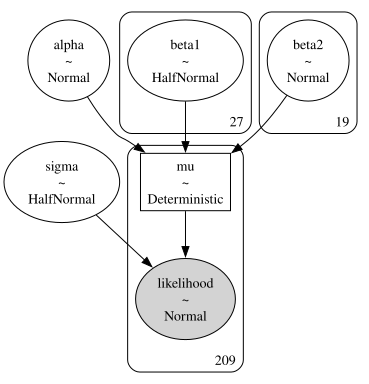

In [33]:
pm.model_to_graphviz(control_model)

### Check prior predictive
...and change model as required

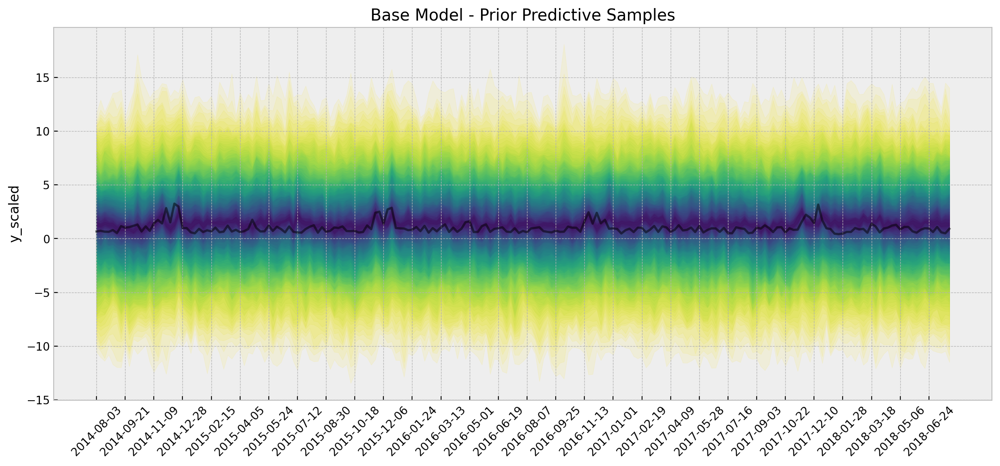

In [34]:
fig, ax = plt.subplots(figsize=(15,6))
palette = "viridis_r"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(control_model_priors.prior_predictive["likelihood"], p, axis=1)
    lower = np.percentile(
        control_model_priors.prior_predictive["likelihood"], 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=df['wk_strt_dt'],
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )
ax.plot(df['wk_strt_dt'], df_control_scaled['sales'], color='black', alpha=0.5)
ax.set_title('Base Model - Prior Predictive Samples')
ax.set_ylabel('y_scaled')

ax.tick_params(axis='x', rotation=45)
ax.set_xticks(df['wk_strt_dt'][0::7])
plt.show()

### Get posterior
i.e.,
- hit the inference button
- check the model diagnostics (trace, r-hat)
- model output (hdi, comparison with target)

In [35]:
with control_model:
    control_model_trace = pm.sample(draws=4000, tune=1000, target_accept=0.95, idata_kwargs={'log_likelihood': True})
    control_model_posterior = pm.sample_posterior_predictive(control_model_trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, beta1, beta2, sigma]


Sampling 4 chains for 1_000 tune and 4_000 draw iterations (4_000 + 16_000 draws total) took 64 seconds.
Sampling: [likelihood]


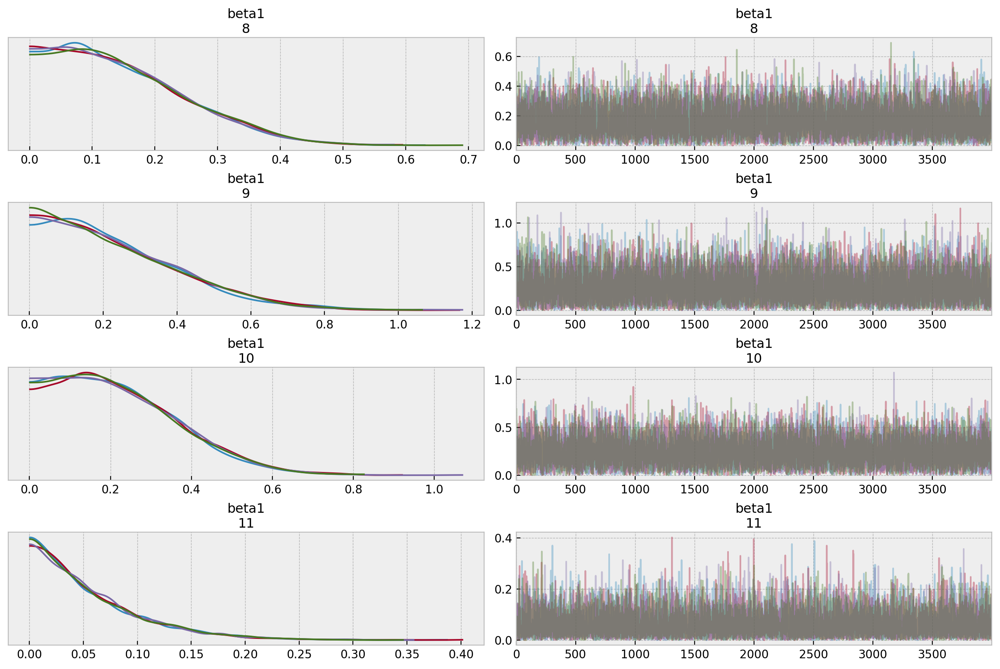

In [36]:
az.plot_trace(control_model_trace.posterior.beta1[:,:,8:12], compact=False,
    backend_kwargs={
        "layout": "constrained"
    })
plt.show()

In [50]:
control_results = az.summary(control_model_trace.posterior.beta2)
control_results['var_name'] = pn_vars
control_results

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,var_name
beta2[0],-0.370,0.674,-1.617,0.886,0.022,0.016,943.0,1523.0,1.0,seas_prd_1
beta2[1],-0.246,0.672,-1.474,1.032,0.022,0.016,932.0,1475.0,1.0,seas_prd_2
beta2[2],-0.105,0.672,-1.360,1.139,0.022,0.016,939.0,1431.0,1.0,seas_prd_3
beta2[3],-0.272,0.672,-1.530,0.978,0.022,0.015,941.0,1474.0,1.0,seas_prd_4
beta2[4],-0.303,0.673,-1.527,0.980,0.022,0.016,936.0,1426.0,1.0,seas_prd_5
beta2[5],-0.483,0.675,-1.765,0.756,0.022,0.016,938.0,1512.0,1.0,seas_prd_6
beta2[6],-0.268,0.672,-1.496,1.018,0.022,0.016,928.0,1440.0,1.0,seas_prd_7
beta2[7],-0.243,0.671,-1.514,0.990,0.022,0.016,935.0,1449.0,1.0,seas_prd_8
beta2[8],-0.286,0.673,-1.536,0.992,0.022,0.016,933.0,1476.0,1.0,seas_prd_9
beta2[9],-0.409,0.673,-1.634,0.879,0.022,0.016,940.0,1467.0,1.0,seas_prd_12


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

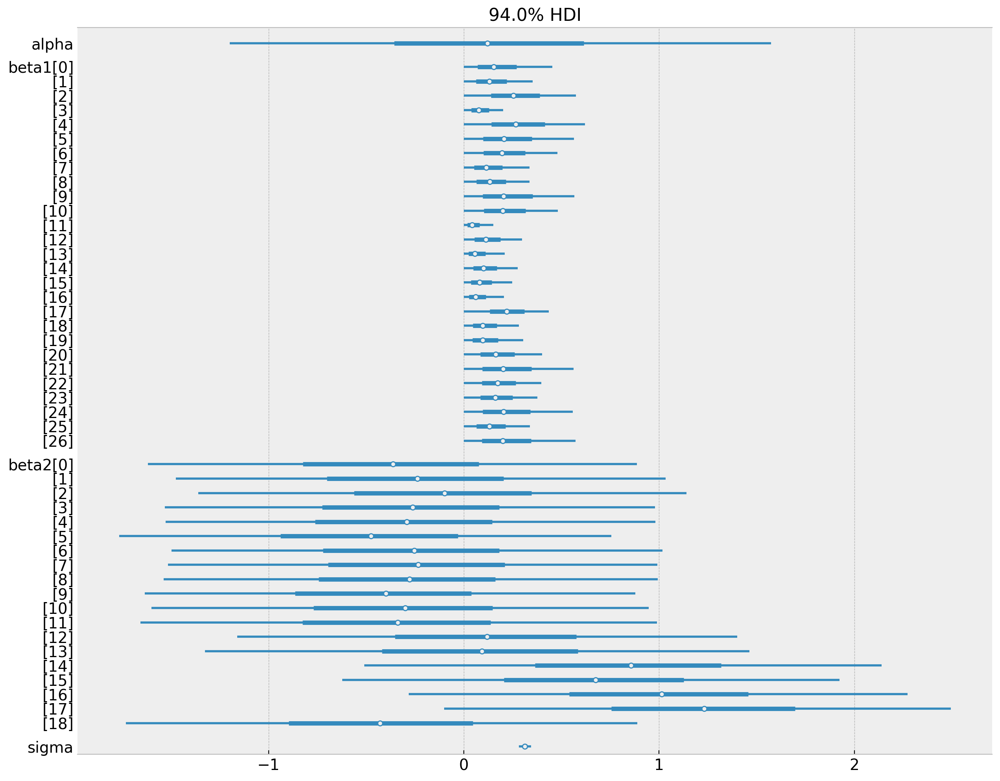

In [49]:
fig, ax = plt.subplots(figsize=(15,12))
az.plot_forest(
    data=control_model_trace,
    kind='forestplot',
    var_names=['alpha', 'beta1','beta2', 'sigma'],
    combined=True,
    ax=ax,
    backend_kwargs={
        "layout": "tight"
    }
    
)

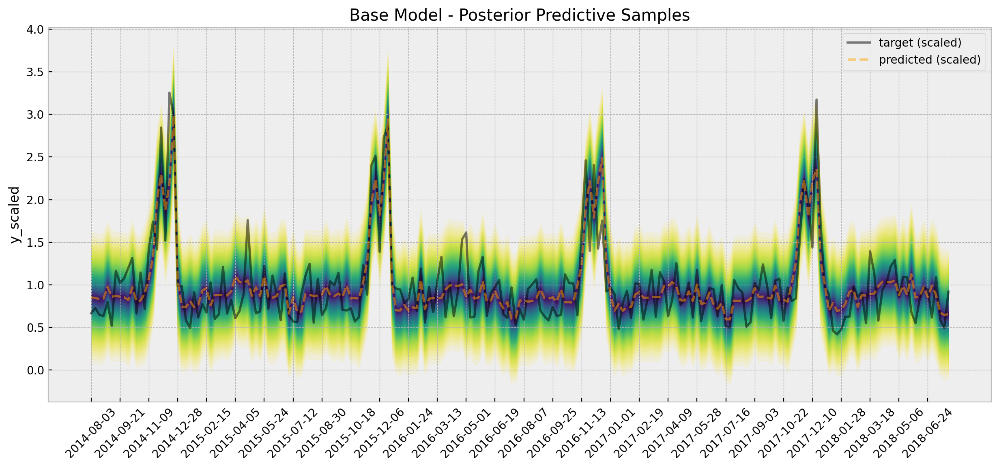

In [77]:
fig, ax = plt.subplots(figsize=(15,6))
posterior_predictive_likelihood_scaled = control_model_posterior.posterior_predictive["likelihood"].stack(sample=('chain', 'draw')) # can do this with az.extract

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_scaled, p, axis=1)
    lower = np.percentile(
        posterior_predictive_likelihood_scaled, 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=df['wk_strt_dt'],
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )
ax.plot(df['wk_strt_dt'], df_control_scaled['sales'], color='black', alpha=0.5, label='target (scaled)')
ax.plot(df['wk_strt_dt'], posterior_predictive_likelihood_scaled.mean(axis=1), '--', color='orange', alpha=0.5, label='predicted (scaled)')
ax.set_title('Base Model - Posterior Predictive Samples')
ax.set_ylabel('y_scaled')

ax.tick_params(axis='x', rotation=45)
ax.set_xticks(df['wk_strt_dt'][0::7])
ax.legend()
plt.show()


In [52]:
df['control_model_sales'] = (posterior_predictive_likelihood_scaled*mean_control['sales']).mean(axis=1)

## Marketing mix model

### Prep data

In [53]:
df_scaled_mmm, sc_mmm = scale_by_mean(df, ['sales', 'control_model_sales'])
df_scaled_log_mmm = np.log1p(df_scaled_mmm) # accurate log transform for very small values
mu_mdip = df[mdip_cols].mean().values
max_lag = 8
num_media = len(mdip_cols)

### Adstock and Saturation functions
Have to define functions that work with pytensors

In [54]:
def delayed_adstock_tensor(x_media, max_lag: int, peak_media: int, alpha_media: int):
    # num_media = x_media.shape[1]
    adstocked = []
    for m in range(num_media):
        x = x_media[:, m]
        peak = peak_media[m]
        alpha = alpha_media[m]
        w = pt.as_tensor_variable([pt.power(alpha, (i-peak)**2) for i in range(max_lag)])
        # for each data point get that and previous max_lag-1 data points
        x_forward = pt.stack(
            [
                pt.concatenate([pt.zeros(i),x[:x.shape[0]-i]])
                for i in range(max_lag)
            ]
        ) # results in a matrix of shape (max_lag, data_points)
        adstocked += [pt.dot(w, x_forward)/pt.sum(w)]

    return pt.stack(adstocked, axis=-1)

def geometric_adstock_tensor(x_media, max_lag: int, alpha_media: int):
    # num_media = x_media.shape[1]
    adstocked = []
    for m in range(num_media):
        x = x_media[:, m]
        alpha = alpha_media[m]
        w = pt.as_tensor_variable([pt.power(alpha, i) for i in range(max_lag)])
        # for each data point get that and previous max_lag-1 data points
        x_forward = pt.stack(
            [
                pt.concatenate([pt.zeros(i),x[:x.shape[0]-i]])
                for i in range(max_lag)
            ]
        ) # results in a matrix of shape (max_lag, data_points)
        adstocked += [pt.dot(w, x_forward)/pt.sum(w)]
    return pt.stack(adstocked, axis=-1)

In [55]:
def hill_transform_tensor(x_media: float, beta_media: float, slope_media: float, half_sat_media: float=1) -> float:
    return beta_media/(1 + (x/half_sat_media)**(-slope_media))

def logistic_saturation_tensor(x_media, lam_media):
    return (1 - pt.exp(-lam_media * x_media)) / (1 + pt.exp(-lam_media * x_media))

### Adstock-only model

#### Create model

In [62]:
with pm.Model() as mmm_model:
    # Data container
    mdip = pm.MutableData('mdip', df[mdip_cols].values)

    # Priors for unknown parameters
    tau = pm.Normal('tau', mu=0, sigma=1)
    sigma = pm.HalfNormal('sigma', sigma=1)

    # Priors for adstock and saturation
    adstock_alpha = pm.Beta('adstock_alpha', alpha=1, beta=1, shape=num_media)
    adstock_peak = pm.Uniform('adstock_peak', lower=0, upper=np.ceil(max_lag/4), shape=num_media)
    
    # Priors for media impressions and control
    beta_mdip = pm.HalfNormal('beta_mdip', sigma=0.1, shape=num_media)
    beta_ctrl = pm.HalfNormal('beta_ctrl', sigma=0.3)

    # Expected value of outcome
    mdip_adstocked = pm.Deterministic('mdip_adstocked', 
        delayed_adstock_tensor(
            mdip, 
            max_lag=8, 
            alpha_media=adstock_alpha, 
            peak_media=adstock_peak
        )
    )
    mdip_adstocked_scaled_log = pm.Deterministic('mdip_adstocked_scaled_log', pt.log1p(mdip_adstocked/mu_mdip))
    mdip_effect = pm.Deterministic('mdip_effect', pm.math.dot(beta_mdip, mdip_adstocked_scaled_log.T))
    ctrl_effect = pm.Deterministic('ctrl_effect', beta_ctrl * df_scaled_log_mmm['control_model_sales'].values)

    mu = pm.Deterministic('mu', tau + mdip_effect + ctrl_effect)

    # Likelihood of observations
    pm.Normal('likelihood', mu=mu, sigma=sigma, observed=df_scaled_log_mmm['sales'])
    mmm_model_priors = pm.sample_prior_predictive(samples=500)

Sampling: [adstock_alpha, adstock_peak, beta_ctrl, beta_mdip, likelihood, sigma, tau]


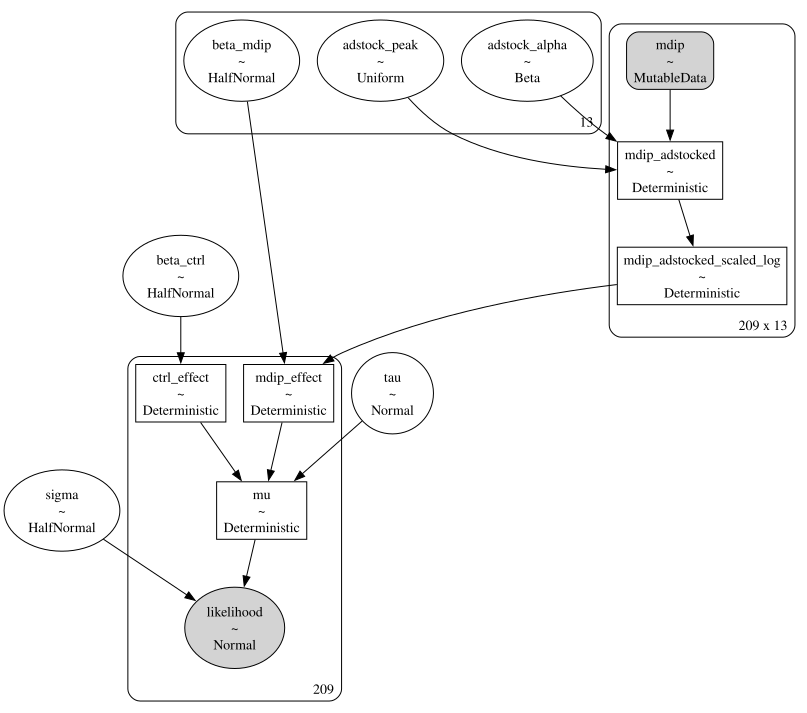

In [63]:
pm.model_to_graphviz(mmm_model)

#### Check prior predictive
...and change model as required

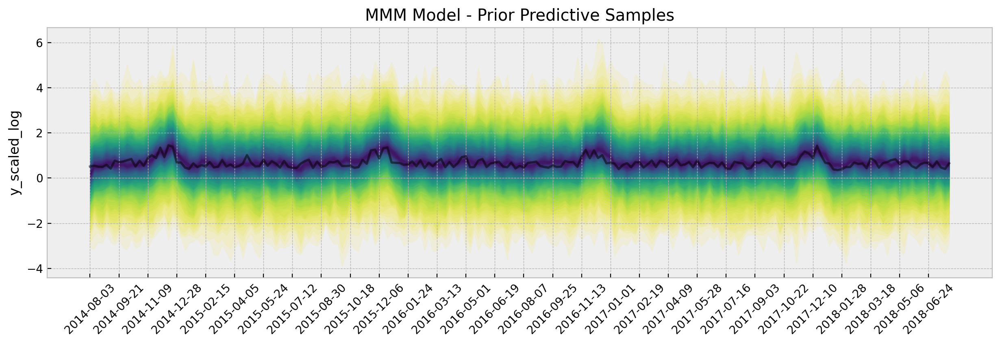

In [64]:
fig, ax = plt.subplots(figsize=(15,4))
palette = "viridis_r"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(mmm_model_priors.prior_predictive["likelihood"], p, axis=1)
    lower = np.percentile(mmm_model_priors.prior_predictive["likelihood"], 100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=df['wk_strt_dt'],
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )
ax.plot(df['wk_strt_dt'], df_scaled_log_mmm['sales'], color='black', alpha=0.5)
ax.set_title('MMM Model - Prior Predictive Samples')
ax.set_ylabel('y_scaled_log')

ax.tick_params(axis='x', rotation=45)
ax.set_xticks(df['wk_strt_dt'][0::7])
plt.show()

#### Get posterior
i.e.,
- hit the inference button
- check the model diagnostics (trace, r-hat)
- model output (hdi, comparison with target)

In [65]:
with mmm_model:
    mmm_model_trace = pm.sample(draws=4000, tune=1000, target_accept=0.95, idata_kwargs={'log_likelihood': True})
    mmm_model_posterior = pm.sample_posterior_predictive(mmm_model_trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [tau, sigma, adstock_alpha, adstock_peak, beta_mdip, beta_ctrl]


Sampling 4 chains for 1_000 tune and 4_000 draw iterations (4_000 + 16_000 draws total) took 257 seconds.
Sampling: [likelihood]


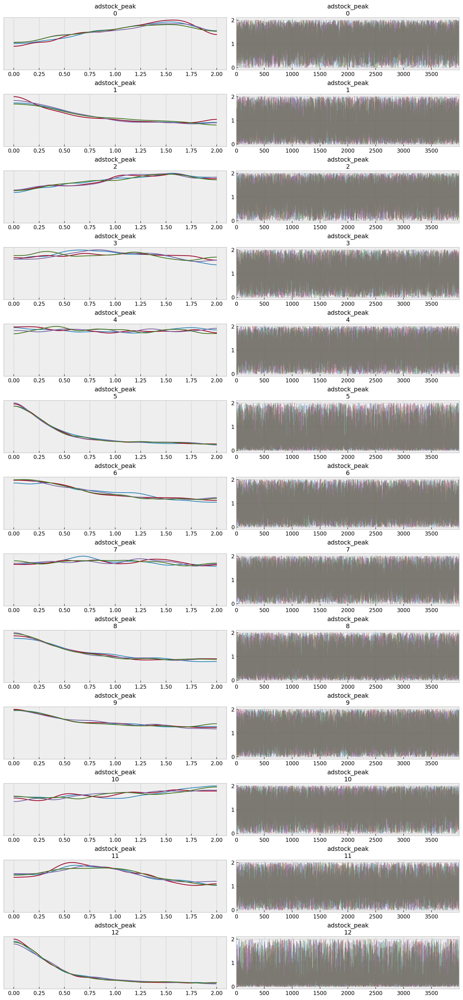

In [66]:
az.plot_trace(mmm_model_trace.posterior.adstock_peak, compact=False,
    backend_kwargs={
        "layout": "constrained"
    })
plt.show()

In [71]:
az.summary(mmm_model_trace.posterior.adstock_alpha)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
adstock_alpha[0],0.516,0.259,0.048,0.945,0.002,0.002,13806.0,9884.0,1.0
adstock_alpha[1],0.506,0.289,0.053,0.989,0.002,0.002,17299.0,9313.0,1.0
adstock_alpha[2],0.500,0.286,0.066,1.000,0.002,0.002,16577.0,10282.0,1.0
adstock_alpha[3],0.502,0.294,0.055,0.998,0.002,0.001,21960.0,9895.0,1.0
adstock_alpha[4],0.513,0.290,0.062,1.000,0.002,0.002,13906.0,9777.0,1.0
adstock_alpha[5],0.422,0.289,0.000,0.906,0.002,0.002,12767.0,9208.0,1.0
adstock_alpha[6],0.516,0.295,0.060,1.000,0.002,0.002,15781.0,9026.0,1.0
adstock_alpha[7],0.502,0.294,0.054,1.000,0.002,0.001,19973.0,9161.0,1.0
adstock_alpha[8],0.493,0.286,0.021,0.951,0.002,0.001,18308.0,9859.0,1.0
adstock_alpha[9],0.512,0.288,0.065,1.000,0.002,0.001,22790.0,9625.0,1.0


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

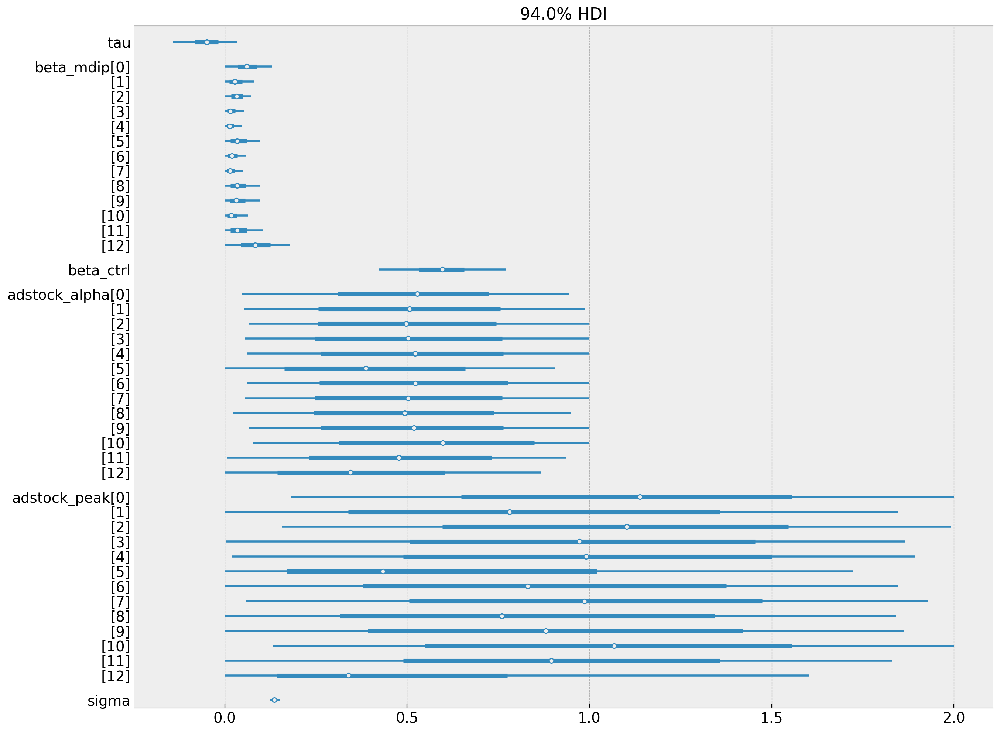

In [72]:
fig, ax = plt.subplots(figsize=(15,12))
az.plot_forest(
    data=mmm_model_trace,
    kind='forestplot',
    var_names=['tau', 'beta_mdip', 'beta_ctrl','adstock_alpha', 'adstock_peak', 'sigma'],
    combined=True,
    ax=ax,
    backend_kwargs={
        "layout": "tight"
    }
    
)

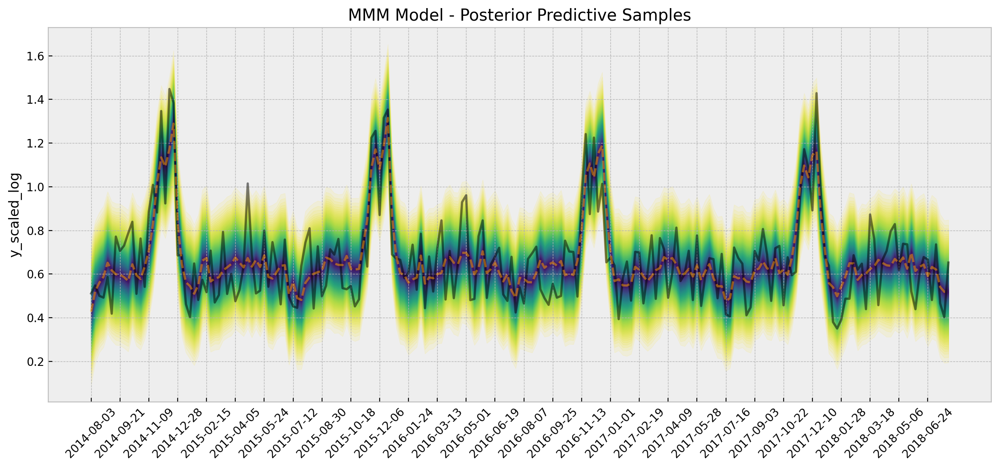

In [78]:
fig, ax = plt.subplots(figsize=(15,6))
posterior_predictive_likelihood_scaled_log = mmm_model_posterior.posterior_predictive["likelihood"].stack(sample=('chain', 'draw')) # can do this with az.extract

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_scaled_log, p, axis=1)
    lower = np.percentile(
        posterior_predictive_likelihood_scaled_log, 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=df['wk_strt_dt'],
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )
ax.plot(df['wk_strt_dt'], df_scaled_log_mmm['sales'], color='black', alpha=0.5, label='target (scaled, log)')
ax.plot(df['wk_strt_dt'], posterior_predictive_likelihood_scaled_log.mean(axis=1), '--', color='orange', alpha=0.5, label='predicted (scaled, log)')
ax.set_title('MMM Model - Posterior Predictive Samples')
ax.set_ylabel('y_scaled_log')

ax.tick_params(axis='x', rotation=45)
ax.set_xticks(df['wk_strt_dt'][0::7])
plt.show()


In [ ]:
mmm_results = az.extract(mmm_model_trace.posterior).mean(dim='sample')
pd.DataFrame({
    'media': [i[5:] for i in mdip_cols],
    'media_name': [media_dict[i] for i in mdip_cols],
    'adstock_peak':mmm_results['adstock_peak'],
    'adstock_alpha':mmm_results['adstock_alpha'],
    'beta':mmm_results['beta_mdip']
})

,media,media_name,adstock_peak,adstock_alpha,beta
0,dm,direct mail,1.239346,0.516949,0.073492
1,inst,insert,1.158128,0.502367,0.033245
2,nsp,newspaper,1.491642,0.502150,0.034042
3,auddig,digital audio,1.386163,0.502755,0.018954
4,audtr,radio,1.444219,0.503529,0.015922
5,vidtr,TV,0.956584,0.475951,0.034882
6,viddig,digital video,1.324697,0.506126,0.021713
7,so,social media,1.432792,0.502266,0.018018
8,on,online display,1.236185,0.502977,0.038369
9,em,email,1.401932,0.504300,0.041532
